In [2]:
import sys, os, distutils.core
from IPython.display import clear_output

!python -m pip install pyyaml==5.1
!git clone 'https://github.com/facebookresearch/detectron2.git'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

In [3]:
# Importing dependencies

import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("detectron2 version:", detectron2.__version__)

import numpy as np
import os, json, cv2, random
from IPython import display
import PIL
import matplotlib.pyplot as plt

# importing detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


SEED = 15
THRESHOLD = 0.5

detectron2 version: 0.6


# <span style="color:#e74c3c;"> Creating </span> Datasets

In [6]:
# Creating coco instances

from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode

# for d in ["train", "val"]:
#     register_coco_instances(f"laboro_tomato_{d}", {},
#                             f"../input/laboro-tomato/annotations/{d}.json",
#                             f"../input/laboro-tomato/{d}/images")


register_coco_instances(f"laboro_tomato_train", {},
                            f"../input/laboro-tomato/annotations/train.json",
                            f"../input/laboro-tomato/train/images")
register_coco_instances(f"laboro_tomato_test", {},
                            f"../input/laboro-tomato/annotations/test.json",
                            f"../input/laboro-tomato/val/images")

AssertionError: Dataset 'laboro_tomato_train' is already registered!

In [5]:
# Examples from the training dataset

import random
from detectron2.utils.visualizer import Visualizer

my_dataset_train_metadata = MetadataCatalog.get("laboro_tomato_train")
train_dataset_dicts = DatasetCatalog.get("laboro_tomato_train")
def create_random_images(dataset_dict,dataset_metadata, seed, image_scale = 0.7):
    np.random.seed(seed)
    images = np.random.permutation(dataset_dict)[:2]
    
    fig, axs = plt.subplots(1,2, figsize = (12,6), dpi = 100)
    for i in range(2):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        vis = visualizer.draw_dataset_dict(im)
        final_img = vis.get_image()
        
        axs[i].set_title('image id: ' + str(img_id), fontsize = 10)
        axs[i].axis('off')
        axs[i].imshow(final_img)

[03/04 05:32:31 d2.data.datasets.coco]: Loaded 643 images in COCO format from ../input/laboro-tomato/annotations/train.json


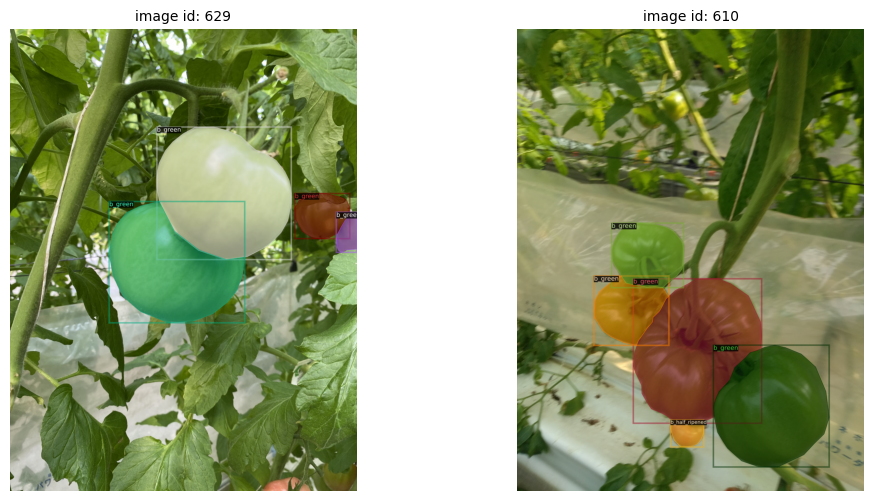

In [7]:
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 65, image_scale = 1)

# <span style="color:#e74c3c;"> Training </span>

In [16]:
from detectron2.engine import DefaultTrainer

EPOCHS = 3000
NUM_CLASSES = 6
BASE_LR = 0.0001

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("laboro_tomato_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = BASE_LR  
cfg.SOLVER.MAX_ITER = EPOCHS    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# uncomment below to train
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/04 05:57:38 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [17]:
# Saving the model

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[03/04 07:01:42 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# <span style="color:#e74c3c;"> Training </span> Results

In [18]:
# original code from https://eidos-ai.medium.com/training-on-detectron2-with-a-validation-set-and-plot-loss-on-it-to-avoid-overfitting-6449418fbf4e

def reading_metrics_from_json(metrics_path):
    metrics = []
    with open(metrics_path, 'r') as f:
        for line in f:
            metrics.append(json.loads(line))
    return metrics


def metric(metrics, specific_metric):
    metric = []
    for i in range(len(metrics)):
        metric.append(metrics[i][specific_metric])
    return metric

In [19]:
train_metrics = reading_metrics_from_json('/kaggle/working/output/metrics.json')

iters = metric(train_metrics, 'iteration')
total_loss = metric(train_metrics, 'total_loss')
cls_acc = metric(train_metrics, 'fast_rcnn/cls_accuracy')
loss_mask = metric(train_metrics, 'loss_mask')
loss_box_reg = metric(train_metrics, 'loss_box_reg')

Text(0.5, 1.0, 'Mask Loss')

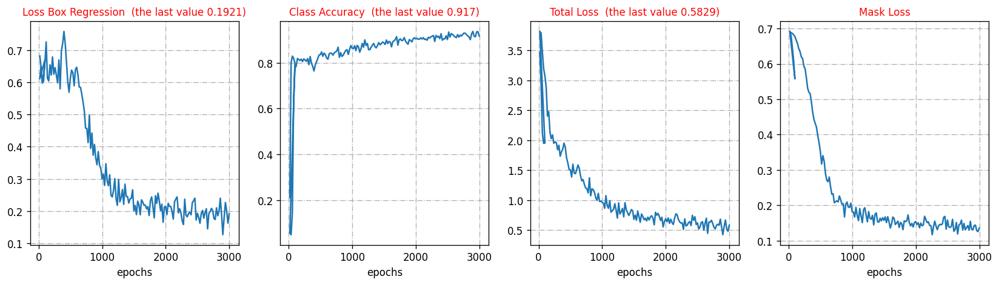

In [20]:
fig, axs = plt.subplots(1,4, figsize = (17, 4), dpi = 120)

axs[0].grid(linestyle = 'dashdot')
axs[0].plot(iters, loss_box_reg)
axs[0].set_xlabel('epochs', fontsize = 10)
axs[0].set_title('Loss Box Regression', fontsize = 10)
tit0 = ' (the last value {0:.4f})'.format(loss_box_reg[-1])
axs[0].set_title('Loss Box Regression ' + tit0, fontsize = 10, color = 'red')

axs[1].grid(linestyle = 'dashdot')
axs[1].plot(iters, cls_acc)
axs[1].set_xlabel('epochs', fontsize = 10)
tit1 = ' (the last value {0:.3f})'.format(cls_acc[-1])
axs[1].set_title('Class Accuracy ' + tit1, fontsize = 10, color = 'red')

axs[2].grid(linestyle = 'dashdot')
axs[2].plot(iters, total_loss)
axs[2].set_xlabel('epochs', fontsize = 10)
tit2 = ' (the last value {0:.4f})'.format(total_loss[-1])
axs[2].set_title('Total Loss ' + tit2, fontsize = 10, color = 'red')

axs[3].grid(linestyle = 'dashdot')
axs[3].plot(iters, loss_mask)
axs[3].set_xlabel('epochs', fontsize = 10)
axs[3].set_title('Mask Loss', fontsize = 10, color = 'red')

# <span style="color:#e74c3c;"> Test </span> Predictions

In [21]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("laboro_tomato_test", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "laboro_tomato_test")
inference_on_dataset(trainer.model, test_loader, evaluator)

[03/04 07:01:58 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[03/04 07:01:58 d2.data.datasets.coco]: Loaded 161 images in COCO format from ../input/laboro-tomato/annotations/test.json
[03/04 07:01:58 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/04 07:01:58 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/04 07:01:58 d2.data.common]: Serializing 161 elements to byte tensors and concatenating them all ...
[03/04 07:01:58 d2.data.common]: Serialized dataset takes 0.69 MiB
[03/04 07:01:58 d2.evaluation.evaluator]: Start inference on 161 batches
[03/04 07:02:32 d2.evaluation.evaluator]: Inference done 11/161. Dataloading: 0.0015 s/iter. Inference: 0.1971 s/iter. Eval: 1.9168 s/iter. Total: 2.1154 s/iter. ETA=0:05:17
[03/04 07:02:39 d2.evaluation.evaluator]: Infere

OrderedDict([('bbox',
              {'AP': 54.50437196639694,
               'AP50': 69.04688883475141,
               'AP75': 61.505198848093045,
               'APs': 0.0,
               'APm': 19.934792618934356,
               'APl': 57.41391640849876,
               'AP-b_fully_ripened': 43.88038617059106,
               'AP-b_half_ripened': 52.373327495809384,
               'AP-b_green': 69.46016366178026,
               'AP-l_fully_ripened': 53.55706924004369,
               'AP-l_half_ripened': 46.25913448880696,
               'AP-l_green': 61.49615074135022}),
             ('segm',
              {'AP': 55.825595920341556,
               'AP50': 68.87725992539207,
               'AP75': 62.808020061439876,
               'APs': 0.0,
               'APm': 12.64946367050365,
               'APl': 58.96125145410649,
               'AP-b_fully_ripened': 46.166117808102136,
               'AP-b_half_ripened': 52.17000194361412,
               'AP-b_green': 72.11911070765125,
     

In [22]:
my_dataset_test_metadata = MetadataCatalog.get("laboro_tomato_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("laboro_tomato_test")

# A function for plotting an original image's bbox and predicted bbox
def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]
    
    fig, axs = plt.subplots(3,2, figsize = (20,20), dpi = 120)
    
    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()
        
        visualizer2 = Visualizer(img[:, :, ::-1], metadata= dataset_metadata, scale=image_scale, instance_mode=ColorMode.IMAGE_BW)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
        
        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 20)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)
        
        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 20, color = 'red')
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox[:, :, ::-1])
        
    fig.tight_layout()


[03/04 07:12:18 d2.data.datasets.coco]: Loaded 161 images in COCO format from ../input/laboro-tomato/annotations/test.json


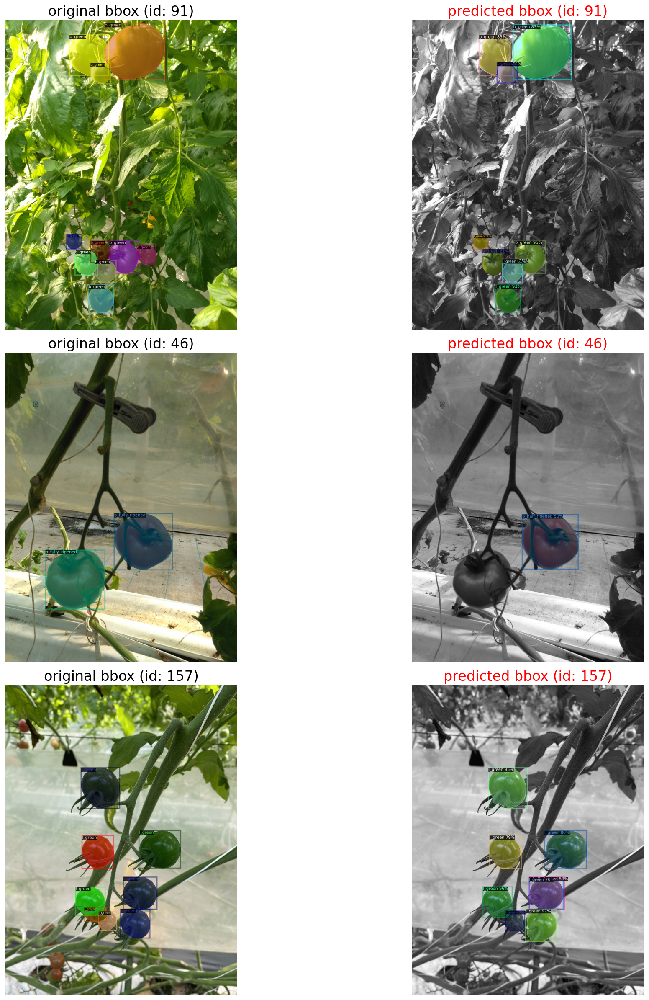

In [23]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 99, image_scale = 2)

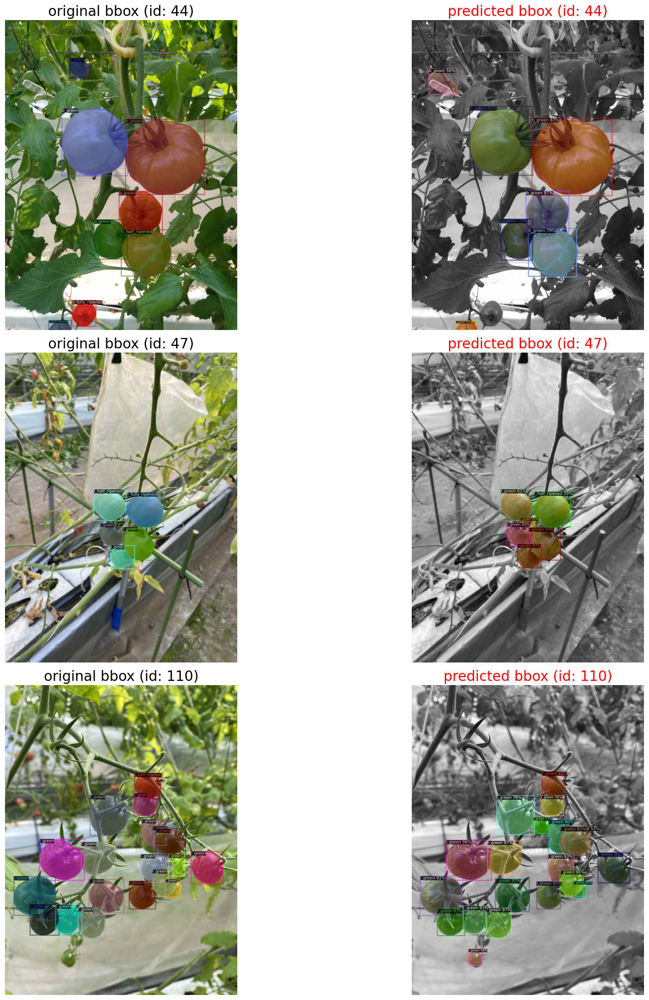

In [24]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 1, image_scale = 2)

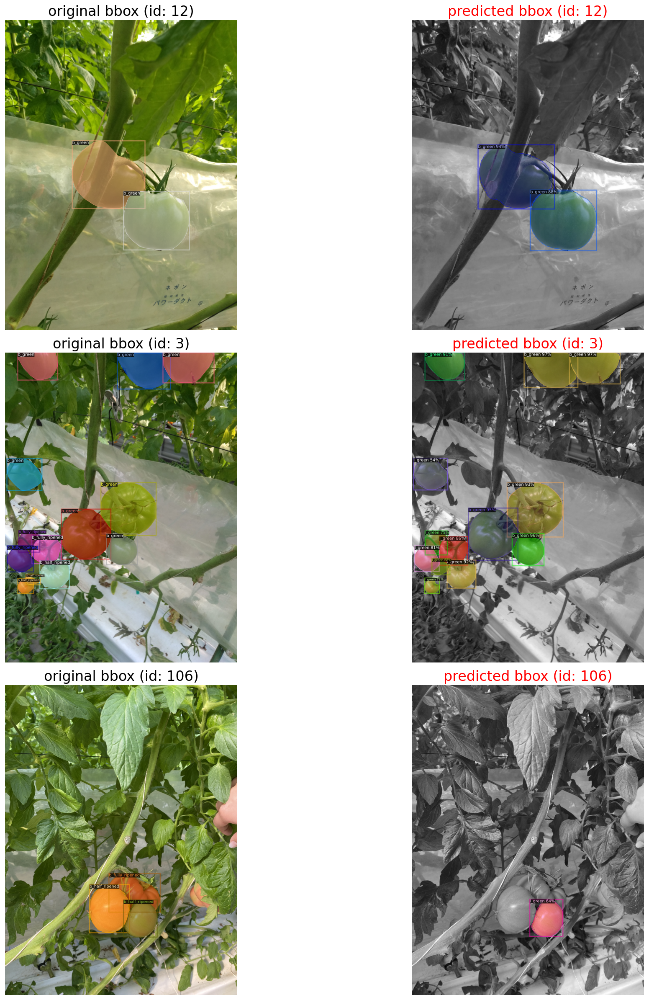

In [25]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 2, image_scale = 2)